# Multi-instrument Music Synthesis with Spectrogram Diffusion

Recent neural synthesizers have exhibited a tradeoff between domain-specific models that offer detailed control of only\
specific instruments, or raw waveform models that can train on any music but with minimal control and slow generation. \
In this work, we focus on a middle ground of neural synthesizers capable of predicting the introduced noise and extracting it from the input.\
Neural audio synthesis of music is a uniquely difficult problem due to the wide variety of instruments, playing\
styles, and acoustic environments. \
We demonstrated  that:
- the generic encoder-decoder Transformer approach used for multi-instrument transcription \
can likewise be adapted for multi-instrument audio synthesis;
- is possible to adapt DDPM decoding for arbitrary length synthesis without edge artifacts, through \
additional autoregressive conditioning on segments (∼5 seconds) of previously generated audio.


<img src="https://storage.googleapis.com/music-synthesis-with-spectrogram-diffusion/architecture.png" alt="Architecture diagram" width=800, height=400>


The previous image is the training configuration for our spectrogram diffusion model. The architecture is an encoder-decoder Transformer\
that takes a sequence of note events as input and outputs a spectrogram. \
We train the decoder stack as a Denoising Diffusion Probabilistic Model (DDPM), where the model learns to iteratively refine Gaussian noise \
into a target spectrogram. We generate ∼5 second spectrogram segments, and to ensure a smooth transition between these segments we (optionally) \
encode the previously generated segment in a second encoder stack.


**Diffusion Decoder**

Taking inspiration from recent successes in image generation such as DALL-E 2 and Imagen , we investigated training the decoder as a Denoising Diffusion Probabilistic Model (DDPM).
DDPMs are models that generate data from noise by
reversing a Gaussian diffusion process that turns an input signal x into noise:

- $\epsilon \sim N(0,I)$

This forward process occurs over diffusion timesteps *t ∈ [0, 1]*. 
In this work, the decoder, $\epsilon_i$ with parameters *i*, is trained to predict the added noise given the noisy data by minimizing an L1 objective:

- $E$ $\enspace \enspace  \omega_t \parallel \epsilon_i(xt,c,t) - \epsilon \parallel$

where *wt* is a loss weighting for different diffusion
timesteps and *c* is additional conditioning information for
the decoder

**Positional Encoding**

As said above, we split the input into segments. In particular, we train models with 2048 input positions per song. The spectrogram was splitted too.
In a song, the order of segmments is important, but the Trasformer does not care about it, treating each segments independently from the others.
Thus, to help the Trasformer in understanding the relative position of each segment, we use Positional Encoding. In practice, this technique is implemented
using sine and cosine functions. Given a position i in the sentence, and the dimension d of the hidden state, the positional encoding PE is given by:
- PE[i, 2 * d + 0] = sin($\frac{i}{10000^{(2 * \frac{d}{d_model})}}$)
- PE[i, 2 * d + 1] = cos($\frac{i}{10000^{(2 * \frac{d}{d_model})}}$)

## Tools installation and Import Libraries

In [1]:
pip install midi2audio --quiet

Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install pretty_midi --quiet

Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install fluidsynth --quiet

Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install -U pip --quiet

Note: you may need to restart the kernel to use updated packages.


In [5]:
pip install -U matplotlib --quiet

Note: you may need to restart the kernel to use updated packages.


In [6]:
pip install librosa --quiet

Note: you may need to restart the kernel to use updated packages.


In [7]:
import torch
from torch import Tensor,relu

import torch.nn as nn
from torch.nn import LayerNorm, MultiheadAttention, Linear, Dropout, ModuleList, Module, GELU

import torch.nn.functional as F
from torch.nn.init import xavier_uniform_

import numpy as np

import math, copy

import dataclasses

from typing import Mapping, Sequence, Union, Optional, Any, Callable

import pretty_midi

import matplotlib.pyplot as plt

import librosa.display
from IPython.display import Audio

import copy

import mido

import matplotlib.pyplot as plt

import torchaudio
import torchaudio.functional as Fa
import torchaudio.transforms as T
from torchaudio.utils import download_asset

import torchvision
from torchvision import transforms
from midi2audio import FluidSynth


## Rendering Audio

We used the library FluidSynth to import the audio in MIDI format and to convert it in WAV format. \
At first, we plot the waveform of our input, then we obtain its spectrogram. Due to the fact that the spectrogram is a 3-dimensional tensor, \
while the waveform is a 2-dimensional tensor, we flattened the former and inserted padding in both of them, to obtain tensors with the same dimension.\
Because of the forbidden necessary computational power to train the model on a full song, we split the input into several segments and we plotted them.

In [8]:
# Functions that plot the waveform and the spectrogram 

def plot_waveform(waveform, sr, title="Waveform"):
    #waveform = waveform.numpy()

    num_channels, num_frames = waveform.shape
    time_axis = torch.arange(0, num_frames) / sr
    figure, axes = plt.subplots()
    axes.plot(time_axis, waveform[0], linewidth=1)
    axes.grid(True)
    figure.suptitle(title)
    plt.show(block=False)

def plot_spectrogram(specgram, title=None, ylabel="freq_bin"):
    fig, axs = plt.subplots(1, 1)
    axs.set_title(title or "Spectrogram (db)")
    axs.set_ylabel(ylabel)
    axs.set_xlabel("frame")
    im = axs.imshow(librosa.power_to_db(specgram), origin="lower", aspect="auto")
    fig.colorbar(im, ax=axs)
    plt.show(block=False)


fluidsynth: error: fluid_is_soundfont(): fopen() failed: 'File does not exist.'
Parameter '/home/flavio/.fluidsynth/default_sound_font.sf2' not a SoundFont or MIDI file or error occurred identifying it.


FluidSynth runtime version 2.2.5
Copyright (C) 2000-2022 Peter Hanappe and others.
Distributed under the LGPL license.
SoundFont(R) is a registered trademark of Creative Technology Ltd.

Rendering audio to file 'output.wav'..


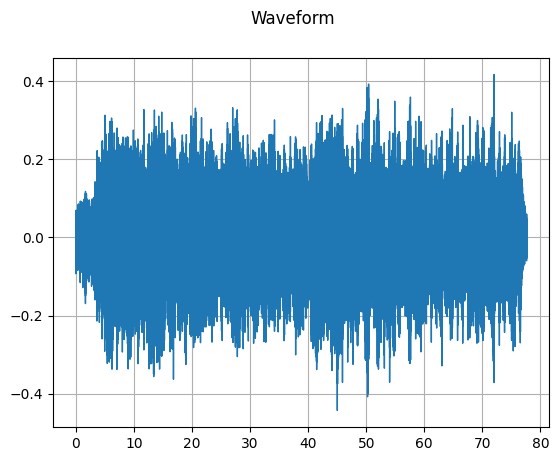

In [9]:
fs = FluidSynth()

#load and convert the audio to .wav
fs.midi_to_audio('/home/flavio/Pirate_of_the_Caribbean.mid','output.wav')

#load the waveform
waveform,sample_rate = torchaudio.load('output.wav')

plot_waveform(waveform, sample_rate)

In [10]:
# Padding, because d_model must be divisible by n_head

pdsrc = (0,19264)
waveform_pad = F.pad(waveform, pdsrc, 'constant', 0)
waveform_pad.shape

torch.Size([2, 3442688])

In [11]:
transform = T.Spectrogram()
spectrogram = transform(waveform)
spectrogram = spectrogram.flatten(1)
pdtgt = (0,1970)
spectrogram_pad = F.pad(spectrogram, pdtgt, 'constant', 0)

spectrogram_pad.shape


torch.Size([2, 3442688])

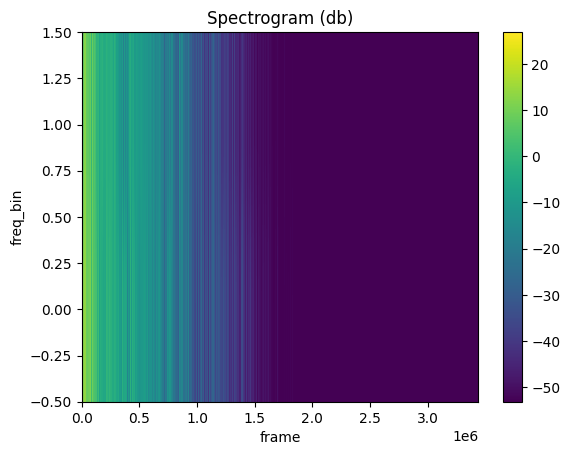

In [12]:
# Spectrogram and audio of the original input

plot_spectrogram(spectrogram)
Audio(waveform, rate=sample_rate)

In [13]:
# Splitting of the waveform and spectrogram into segments

waveform_list=torch.tensor_split(waveform_pad, 1681, dim=1)
spectrogram_list=torch.tensor_split(spectrogram_pad, 1681, dim=1)

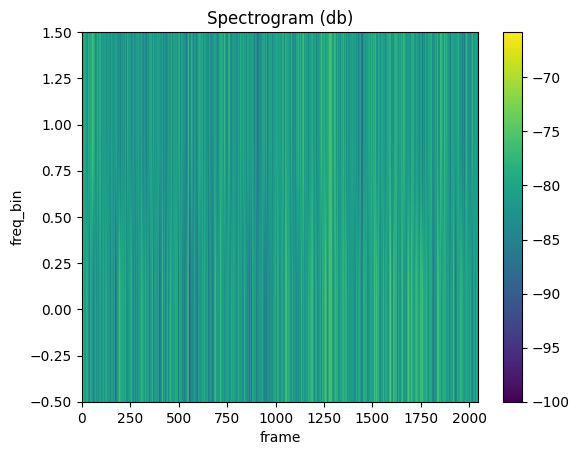

In [14]:
# Spectrogram and audio of a segment of the original input

plot_spectrogram(spectrogram_list[1500])
Audio(waveform_list[1500], rate=sample_rate)

## **Transformer Structure**


### *TransformerEncoder*

This class represents the encoder. It is formed by the two encoders in parallel. \
Each encoder is  composed by a *num_encoder_layers* stacks of blocks. Each of them is composed by:
- Layer Normalization
- Self-attention Layer
- Skip-connection
- Layer Normalization
- Feed-Forward network (with *dim_feedforward* dimension)
- Skip-connection

Also a Dropout is applied, ...\

The Feed-Forward Network

We implemented from scratch the architecture of the Encoders, while we took from Pytorch the part of dimension and type controls.

In [15]:
class TransformermiosecondarioEncoder(nn.Module):
    """Args:
        d_model: the number of expected features in the encoder/decoder inputs (default=512).
        nhead: the number of heads in the multiheadattention models (default=8).
        num_encoder_layers: the number of sub-encoder-layers in the encoder (default=6).
        num_decoder_layers: the number of sub-decoder-layers in the decoder (default=6).
        dim_feedforward: the dimension of the feedforward network model (default=2048).
        dropout: the dropout value (default=0.1).
        activation: the activation function of encoder/decoder intermediate layer, can be a string
            ("relu" or "gelu") or a unary callable. Default: relu
        custom_encoder: custom encoder (default=None).
        custom_decoder: custom decoder (default=None).
        layer_norm_eps: the eps value in layer normalization components (default=1e-5).
        batch_first: If ``True``, then the input and output tensors are provided
            as (batch, seq, feature). Default: ``False`` (seq, batch, feature).
        norm_first: if ``True``, encoder and decoder layers will perform LayerNorms before
            other attention and feedforward operations, otherwise after. Default: ``False`` (after).

    """

    def __init__(self, d_model: int = 2048,  nhead: int = 6, num_encoder_layers: int = 8,
                 dim_feedforward: int = 1024, dropout: float = 0.1,
                 activation: Union[str, Callable[[Tensor], Tensor]] = F.gelu,
                 custom_encoder: Optional[Any] = None, layer_norm_eps: float = 1e-5, 
                 batch_first: bool = False, norm_first: bool = True,
                 device=None, dtype=None) -> None:
        factory_kwargs = {'device': device, 'dtype': dtype}
        super(TransformermiosecondarioEncoder, self).__init__()
        self.d_model = d_model

        # if we have a custom encoder and we want to use it
        if custom_encoder is not None:
            self.encoder = custom_encoder
        
        else:
            ######################################## 1 encoder ###########################################
            encoder_layer1 = TransformerEncoderLayer(d_model, nhead, dim_feedforward, dropout,
                                                    activation, layer_norm_eps, batch_first, norm_first,
                                                    **factory_kwargs)
            encoder_norm = LayerNorm(d_model, eps=layer_norm_eps, **factory_kwargs)
            self.encoder1 = TransformerEncoder(encoder_layer1, num_encoder_layers, encoder_norm)
            
            ######################################## 2 encoder ###########################################
            encoder_layer2 = TransformerEncoderLayer(d_model, nhead, dim_feedforward, dropout,
                                                    activation, layer_norm_eps, batch_first, norm_first,
                                                    **factory_kwargs)
            encoder_norm = LayerNorm(d_model, eps=layer_norm_eps, **factory_kwargs)
            self.encoder2 = TransformerEncoder(encoder_layer2, num_encoder_layers, encoder_norm)
        
        self._reset_parameters()

        self.d_model = d_model
        self.nhead = nhead

        self.batch_first = batch_first

    def forward(self, src: Tensor, src2: Tensor, tgt: Tensor,                                   # src and src2 are the inputs of the encoders,
                                                                                                # tgt is the spectrogram of our input (src)
                src_mask: Optional[Tensor] = None, tgt_mask: Optional[Tensor] = None,
                src_key_padding_mask: Optional[Tensor] = None) -> Tensor:
        r"""Take in and process masked source/target sequences.

        Args:
            src: the sequence to the encoder (required).
            tgt: the sequence to the decoder (required).
            src_mask: the additive mask for the src sequence (optional).
            tgt_mask: the additive mask for the tgt sequence (optional).
            src_key_padding_mask: the ByteTensor mask for src keys per batch (optional).

        """

        ### Controls of dimensions    
        is_batched = src.dim() == 3
        if not self.batch_first and src.size(1) != tgt.size(1) and src2.size(1) != tgt.size(1) and is_batched:
            raise RuntimeError("the batch number of src and tgt must be equal")
        elif self.batch_first and src.size(0) != tgt.size(0) and src2.size(0) != tgt.size(0) and is_batched:
            raise RuntimeError("the batch number of src and tgt must be equal")
        
        if src.size(-1) != self.d_model  or src2.size(-1) != self.d_model:
            raise RuntimeError("the feature number of src and tgt must be equal to d_model")
        ############################

        
        # The outputs of the two encoders are concatenated
        memory1 = self.encoder1(src, mask=src_mask, src_key_padding_mask=src_key_padding_mask)
        memory2 = self.encoder2(src2, mask=src_mask, src_key_padding_mask=src_key_padding_mask)
        output = torch.cat((memory2, memory1), 1)
        
        return output

    def _reset_parameters(self):
        r"""Initiate parameters in the transformer model."""

        for p in self.parameters():
            if p.dim() > 1:
                xavier_uniform_(p)



### TransformerEncoder  

This class represents the structure of a single encoder

Arguments:
- *encoder_layer*: an instance of the TransformerEncoderLayer() class (required).
- *num_layers*: the number of sub-encoder-layers in the encoder (required).
- *norm*: the layer normalization component (optional).
- *enable_nested_tensor*: if True, input will automatically convert to nested tensor
            (and convert back on output). This will improve the overall performance of
            TransformerEncoder when padding rate is high. Default: ``True`` (enabled)

In [16]:


class TransformerEncoder(Module):
    
    __constants__ = ['norm']

    def __init__(self, encoder_layer, num_layers, norm=None, enable_nested_tensor=True, mask_check=True):
        super(TransformerEncoder, self).__init__()
        self.layers = _get_clones(encoder_layer, num_layers)
        self.num_layers = num_layers
        self.norm = norm
        self.enable_nested_tensor = enable_nested_tensor
        self.mask_check = mask_check

    def forward(self, src: Tensor, mask: Optional[Tensor] = None, src_key_padding_mask: Optional[Tensor] = None) -> Tensor:
        r"""Pass the input through the encoder layers in turn.

        Args:
            src: the sequence to the encoder (required).
            mask: the mask for the src sequence (optional).
            src_key_padding_mask: the mask for the src keys per batch (optional).

        """


        ### Controls of errors
        if src_key_padding_mask is not None:
            _skpm_dtype = src_key_padding_mask.dtype
            if _skpm_dtype != torch.bool and not torch.is_floating_point(src_key_padding_mask):
                raise AssertionError(
                    "only bool and floating types of key_padding_mask are supported")
        output = src
        convert_to_nested = False
        first_layer = self.layers[0]
        src_key_padding_mask_for_layers = src_key_padding_mask
        why_not_sparsity_fast_path = ''
        str_first_layer = "self.layers[0]"
        if not isinstance(first_layer, torch.nn.TransformerEncoderLayer):
            why_not_sparsity_fast_path = f"{str_first_layer} was not TransformerEncoderLayer"
        elif first_layer.norm_first :
            why_not_sparsity_fast_path = f"{str_first_layer}.norm_first was True"
        elif first_layer.training:
            why_not_sparsity_fast_path = f"{str_first_layer} was in training mode"
        elif not first_layer.self_attn.batch_first:
            why_not_sparsity_fast_path = f" {str_first_layer}.self_attn.batch_first was not True"
        elif not first_layer.self_attn._qkv_same_embed_dim:
            why_not_sparsity_fast_path = f"{str_first_layer}.self_attn._qkv_same_embed_dim was not True"
        elif not first_layer.activation_relu_or_gelu:
            why_not_sparsity_fast_path = f" {str_first_layer}.activation_relu_or_gelu was not True"
        elif not (first_layer.norm1.eps == first_layer.norm2.eps) :
            why_not_sparsity_fast_path = f"{str_first_layer}.norm1.eps was not equal to {str_first_layer}.norm2.eps"
        elif not src.dim() == 3:
            why_not_sparsity_fast_path = f"input not batched; expected src.dim() of 3 but got {src.dim()}"
        elif not self.enable_nested_tensor:
            why_not_sparsity_fast_path = "enable_nested_tensor was not True"
        elif src_key_padding_mask is None:
            why_not_sparsity_fast_path = "src_key_padding_mask was None"
        elif (((not hasattr(self, "mask_check")) or self.mask_check)
                and not torch._nested_tensor_from_mask_left_aligned(src, src_key_padding_mask.logical_not())):
            why_not_sparsity_fast_path = "mask_check enabled, and src and src_key_padding_mask was not left aligned"
        elif output.is_nested:
            why_not_sparsity_fast_path = "NestedTensor input is not supported"
        elif mask is not None:
            why_not_sparsity_fast_path = "src_key_padding_mask and mask were both supplied"
        elif first_layer.self_attn.num_heads % 2 == 1:
            why_not_sparsity_fast_path = "num_head is odd"
        elif torch.is_autocast_enabled():
            why_not_sparsity_fast_path = "autocast is enabled"

        if not why_not_sparsity_fast_path:
            tensor_args = (
                src,
                first_layer.self_attn.in_proj_weight,
                first_layer.self_attn.in_proj_bias,
                first_layer.self_attn.out_proj.weight,
                first_layer.self_attn.out_proj.bias,
                first_layer.norm1.weight,
                first_layer.norm1.bias,
                first_layer.norm2.weight,
                first_layer.norm2.bias,
                first_layer.linear1.weight,
                first_layer.linear1.bias,
                first_layer.linear2.weight,
                first_layer.linear2.bias,
            )

            if torch.overrides.has_torch_function(tensor_args):
                why_not_sparsity_fast_path = "some Tensor argument has_torch_function"
            elif not (src.is_cuda or 'cpu' in str(src.device)):
                why_not_sparsity_fast_path = "src is neither CUDA nor CPU"
            elif torch.is_grad_enabled() and any(x.requires_grad for x in tensor_args):
                why_not_sparsity_fast_path = ("grad is enabled and at least one of query or the "
                                              "input/output projection weights or biases requires_grad")

            if (not why_not_sparsity_fast_path) and (src_key_padding_mask is not None):
                convert_to_nested = True
                output = torch._nested_tensor_from_mask(output, src_key_padding_mask.logical_not(), mask_check=False)
                src_key_padding_mask_for_layers = None
        ############################

        
        for mod in self.layers:
            output = mod(output, src_mask=mask, src_key_padding_mask=src_key_padding_mask_for_layers)

        if convert_to_nested:
            output = output.to_padded_tensor(0.)

        if self.norm is not None:
            output = self.norm(output)

        return output



# Create N clones of the block layer
def _get_clones(module, N):
    return ModuleList([copy.deepcopy(module) for i in range(N)])



### TransformerEncoderLayer 

This class represents a single block of the Encoder

Arguments:
- *d_model*: the number of expected features in the input (required).
- *nhead*: the number of heads in the multiheadattention models (required).
- *dim_feedforward*: the dimension of the feedforward network model (default=2048).
- *dropout*: the dropout value (default=0.1).
- *activation*: the activation function of the intermediate layer, can be a string
     ("relu" or "gelu") or a unary callable. Default: relu
- *layer_norm_eps*: the eps value in layer normalization components (default=1e-5).
- *batch_first*: If ``True``, then the input and output tensors are provided
     as (batch, seq, feature). Default: ``False`` (seq, batch, feature).
- *norm_first*: if ``True``, layer norm is done prior to attention and feedforward
    operations, respectively. Otherwise it's done after. Default: ``False`` (after).


In [17]:

class TransformerEncoderLayer(Module):
    

    __constants__ = ['batch_first', 'norm_first']

    def __init__(self, d_model: int, nhead: int, dim_feedforward: int = 1024, dropout: float = 0.1,
                 activation: Union[str, Callable[[Tensor], Tensor]] = F.gelu,
                 layer_norm_eps: float = 1e-5, batch_first: bool = False, norm_first: bool = True,
                 device=None, dtype=None) -> None:

        factory_kwargs = {'device': device, 'dtype': dtype}
        super(TransformerEncoderLayer, self).__init__()

        # Self-attention layer
        self.self_attn = MultiheadAttention(d_model, nhead, dropout=dropout, batch_first=batch_first,
                                            **factory_kwargs)
       
       
        # Implementation of Feedforward model
        self.linear1 = Linear(d_model, dim_feedforward, **factory_kwargs)
        self.dropout = Dropout(dropout)
        self.linear2 = Linear(dim_feedforward, d_model, **factory_kwargs)

        self.norm_first = norm_first
        self.norm1 = LayerNorm(d_model, eps=layer_norm_eps, **factory_kwargs)
        self.norm2 = LayerNorm(d_model, eps=layer_norm_eps, **factory_kwargs)
        self.dropout1 = Dropout(dropout)
        self.dropout2 = Dropout(dropout)

        # Legacy string support for activation function.
        if isinstance(activation, str):
            activation = _get_activation_fn(activation)

        # We can't test self.activation in forward() in TorchScript,
        # so stash some information about it instead.
        if activation is F.relu or isinstance(activation, torch.nn.ReLU):
            self.activation_relu_or_gelu = 1
        elif activation is F.gelu or isinstance(activation, torch.nn.GELU):
            self.activation_relu_or_gelu = 2
        else:
            self.activation_relu_or_gelu = 0
        self.activation = activation

    def __setstate__(self, state):
        super(TransformerEncoderLayer, self).__setstate__(state)
        if not hasattr(self, 'activation'):
            self.activation = F.gelu


    def forward(self, src: Tensor, src_mask: Optional[Tensor] = None,
                src_key_padding_mask: Optional[Tensor] = None) -> Tensor:
        r"""Pass the input through the encoder layer.

        Args:
            src: the sequence to the encoder layer (required).
            src_mask: the mask for the src sequence (optional).
            src_key_padding_mask: the mask for the src keys per batch (optional).

        """


        ###Controls of errors
        if src_key_padding_mask is not None:
            _skpm_dtype = src_key_padding_mask.dtype
            if _skpm_dtype != torch.bool and not torch.is_floating_point(src_key_padding_mask):
                raise AssertionError(
                    "only bool and floating types of key_padding_mask are supported")
        # see Fig. 1 of https://arxiv.org/pdf/2002.04745v1.pdf
        why_not_sparsity_fast_path = ''
        if not src.dim() == 3:
            why_not_sparsity_fast_path = f"input not batched; expected src.dim() of 3 but got {src.dim()}"
        elif self.training:
            why_not_sparsity_fast_path = "training is enabled"
        elif not self.self_attn.batch_first :
            why_not_sparsity_fast_path = "self_attn.batch_first was not True"
        elif not self.self_attn._qkv_same_embed_dim :
            why_not_sparsity_fast_path = "self_attn._qkv_same_embed_dim was not True"
        elif not self.activation_relu_or_gelu:
            why_not_sparsity_fast_path = "activation_relu_or_gelu was not True"
        elif not (self.norm1.eps == self.norm2.eps):
            why_not_sparsity_fast_path = "norm1.eps is not equal to norm2.eps"
        elif src_mask is not None:
            why_not_sparsity_fast_path = "src_mask is not supported for fastpath"
        elif src.is_nested and src_key_padding_mask is not None:
            why_not_sparsity_fast_path = "src_key_padding_mask is not supported with NestedTensor input for fastpath"
        elif self.self_attn.num_heads % 2 == 1:
            why_not_sparsity_fast_path = "num_head is odd"
        elif torch.is_autocast_enabled():
            why_not_sparsity_fast_path = "autocast is enabled"

        if not why_not_sparsity_fast_path:
            tensor_args = (
                src,
                self.self_attn.in_proj_weight,
                self.self_attn.in_proj_bias,
                self.self_attn.out_proj.weight,
                self.self_attn.out_proj.bias,
                self.norm1.weight,
                self.norm1.bias,
                self.norm2.weight,
                self.norm2.bias,
                self.linear1.weight,
                self.linear1.bias,
                self.linear2.weight,
                self.linear2.bias,
            )

            # We have to use list comprehensions below because TorchScript does not support
            # generator expressions.
            if torch.overrides.has_torch_function(tensor_args):
                why_not_sparsity_fast_path = "some Tensor argument has_torch_function"
            elif not all((x.is_cuda or 'cpu' in str(x.device)) for x in tensor_args):
                why_not_sparsity_fast_path = "some Tensor argument is neither CUDA nor CPU"
            elif torch.is_grad_enabled() and any(x.requires_grad for x in tensor_args):
                why_not_sparsity_fast_path = ("grad is enabled and at least one of query or the "
                                              "input/output projection weights or biases requires_grad")

            if not why_not_sparsity_fast_path:
                return torch._transformer_encoder_layer_fwd(
                    src,
                    self.self_attn.embed_dim,
                    self.self_attn.num_heads,
                    self.self_attn.in_proj_weight,
                    self.self_attn.in_proj_bias,
                    self.self_attn.out_proj.weight,
                    self.self_attn.out_proj.bias,
                    self.activation_relu_or_gelu == 2,
                    self.norm_first,
                    self.norm1.eps,
                    self.norm1.weight,
                    self.norm1.bias,
                    self.norm2.weight,
                    self.norm2.bias,
                    self.linear1.weight,
                    self.linear1.bias,
                    self.linear2.weight,
                    self.linear2.bias,
                    # TODO: if src_mask and src_key_padding_mask merge to single 4-dim mask
                    src_mask if src_mask is not None else src_key_padding_mask,
                    1 if src_key_padding_mask is not None else
                    0 if src_mask is not None else
                    None,
                )
        ################################

        # In order:     Normalization -> Self-attention block -> Dropout
        x = src
        if self.norm_first:
            x = self.dropout(x) + self._sa_block(self.norm1(x), src_mask, src_key_padding_mask)
            x = self.dropout(x) + self._ff_block(self.norm2(x))
        else:
            x = self.norm1(x + self._sa_block(x, src_mask, src_key_padding_mask))
            x = self.norm2(x + self._ff_block(x))

        return x


    # self-attention block
    def _sa_block(self, x: Tensor,
                  attn_mask: Optional[Tensor], key_padding_mask: Optional[Tensor]) -> Tensor:
        x = self.self_attn(x, x, x,
                           attn_mask=attn_mask,
                           key_padding_mask=key_padding_mask,
                           need_weights=False)[0]
        return self.dropout1(x)

    # feed forward block
    def _ff_block(self, x: Tensor) -> Tensor:
        x = self.linear2(self.dropout(self.activation(self.linear1(x))))
        return self.dropout2(x)


def _get_activation_fn(activation: str) -> Callable[[Tensor], Tensor]:
    if activation == "relu":
        return F.relu
    elif activation == "gelu":
        return F.gelu

    raise RuntimeError("activation should be relu/gelu, not {}".format(activation))


## TransformerDecoder

This class represents the encoder. It is formed by the two encoders in parallel. \
Each encoder is  composed by a *num_encoder_layers* stacks of blocks. Each of them is composed by:
- Layer Normalization
- Self-attention Layer
- Skip-connection
- Layer Normalization
- Cross-Attention Layer
- Skip-connection
- Layer Normalization
- Feed-Forward network (with *dim_feedforward* dimension)
- Skip-connection\

Also a Dropout is applied within the feed-forward network, on the skip connection, on the attention weights,\
and at the input and output of the entire stack.
The last block of the decoder has an additional subcomponent, which is a Dense layer with soft-max.

We implemented from scratch the architecture of the Encoders, while we took from Pytorch the part of dimension and type controls.

In [18]:
class TransformermiosecondarioDecoder(nn.Module):

    def __init__(self, d_model: int = 4096,  nhead: int = 8,
                 num_decoder_layers: int = 10, dim_feedforward: int = 1024, dropout: float = 0.1,
                 activation: Union[str, Callable[[Tensor], Tensor]] = F.gelu,
                 layer_norm_eps: float = 1e-5, batch_first: bool = False, norm_first: bool = True,
                 device=None, dtype=None, time_emb_dim = 32) -> None:
        factory_kwargs = {'device': device, 'dtype': dtype}
        
        super(TransformermiosecondarioDecoder, self).__init__()
        self.d_model = d_model
        self.num_decoder_layers=num_decoder_layers
        
        self.decoder_layer = TransformerDecoderLayer(d_model, nhead,time_emb_dim, dim_feedforward, dropout,
                                                activation, layer_norm_eps, batch_first, norm_first,
                                                **factory_kwargs)
        self.decoder_norm = LayerNorm(d_model,eps=layer_norm_eps, **factory_kwargs)
        #self.decoder = TransformerDecoder(decoder_layer, num_decoder_layers, decoder_norm)
            
        # Time embedding
        self.time_mlp = nn.Sequential(
            SinusoidalPositionEmbeddings(time_emb_dim),
            nn.Linear(time_emb_dim, time_emb_dim),
            nn.ReLU()
        )
        

        #self._reset_parameters()

        #self.d_model = d_model
        self.nhead = nhead

        self.batch_first = batch_first

    def forward(self, timestep: int, src: Tensor, tgt: Tensor, src_mask: Optional[Tensor] = None, tgt_mask: Optional[Tensor] = None,
                memory_mask: Optional[Tensor] = None, src_key_padding_mask: Optional[Tensor] = None,
                tgt_key_padding_mask: Optional[Tensor] = None, memory_key_padding_mask: Optional[Tensor] = None) -> Tensor:
        

        is_batched = src.dim() == 3
        if not self.batch_first and src.size(1) != tgt.size(1) and is_batched:
            raise RuntimeError("the batch number of src and tgt must be equal")
        elif self.batch_first and src.size(0) != tgt.size(0) and is_batched:
            raise RuntimeError("the batch number of src and tgt must be equal")
        
        if src.size(-1) != self.d_model :
            raise RuntimeError("the feature number of src and tgt must be equal to d_model")

        t = self.time_mlp(timestep)
        
        for i in range(0, self.num_decoder_layers):

            tgt = self.decoder_layer(tgt, src, t)
        
        return tgt


    def _reset_parameters(self):
        r"""Initiate parameters in the transformer model."""

        for p in self.parameters():
            if p.dim() > 1:
                xavier_uniform_(p)



### TransformerDecoderLayer

This class represents a single block of the Decoder

In [19]:
     
class TransformerDecoderLayer(Module): 
    __constants__ = ['batch_first', 'norm_first']

    def __init__(self, d_model: int, nhead: int, time_emb_dim: int, dim_feedforward: int = 1024, dropout: float = 0.1,
                 activation: Union[str, Callable[[Tensor], Tensor]] = F.gelu,
                 layer_norm_eps: float = 1e-5, batch_first: bool = False, norm_first: bool = True,
                 device=None, dtype=None) -> None:
        factory_kwargs = {'device': device, 'dtype': dtype}
        
        super(TransformerDecoderLayer, self).__init__()
        self.self_attn = MultiheadAttention(d_model, nhead, dropout=dropout, batch_first=batch_first,
                                            **factory_kwargs)
        self.multihead_attn = MultiheadAttention(d_model, nhead, dropout=dropout, batch_first=batch_first,
                                                 **factory_kwargs)
        
        self.time_mlp =  nn.Linear(time_emb_dim, 1)
        
        # Implementation of Feedforward model
        self.linear1 = Linear(d_model, dim_feedforward, **factory_kwargs)
        self.dropout = Dropout(dropout)
        self.linear2 = Linear(dim_feedforward, d_model, **factory_kwargs)

        self.norm_first = norm_first
        self.norm1 = LayerNorm(d_model , eps=layer_norm_eps, **factory_kwargs)
        self.norm2 = LayerNorm(d_model, eps=layer_norm_eps, **factory_kwargs)
        self.norm3 = LayerNorm(d_model, eps=layer_norm_eps, **factory_kwargs)
        self.dropout1 = Dropout(dropout)
        self.dropout2 = Dropout(dropout)
        self.dropout3 = Dropout(dropout)

        # Legacy string support for activation function.
        if isinstance(activation, str):
            self.activation = _get_activation_fn(activation)
        else:
            self.activation = activation

    def __setstate__(self, state):
        if 'activation' not in state:
            state['activation'] = F.gelu
        super(TransformerDecoderLayer, self).__setstate__(state)

    def forward(self, tgt: Tensor, memory: Tensor, t: int, tgt_mask: Optional[Tensor] = None, memory_mask: Optional[Tensor] = None,
                tgt_key_padding_mask: Optional[Tensor] = None, memory_key_padding_mask: Optional[Tensor] = None) -> Tensor:

        time_emb = self.activation(self.time_mlp(t))

        x = tgt
        if self.norm_first:
            x = self.dropout(x) + self._sa_block(self.norm1(x), tgt_mask, tgt_key_padding_mask)
            x = x + time_emb    #FILM layer
            x = self.dropout(x) + self._mha_block(self.norm2(x), memory, memory_mask, memory_key_padding_mask)
            x = x + time_emb    #FILM layer
            x = self.dropout(x) + self._ff_block(self.norm3(x))
        else:
            x = self.norm1(x + self._sa_block(x, tgt_mask, tgt_key_padding_mask))
            x = x + time_emb
            x = self.norm2(x + self._mha_block(x, memory, memory_mask, memory_key_padding_mask))
            x = x + time_emb
            x = self.norm3(x + self._ff_block(x))

        return x


    # self-attention block
    def _sa_block(self, x: Tensor,
                  attn_mask: Optional[Tensor], key_padding_mask: Optional[Tensor]) -> Tensor:
        x = self.self_attn(x, x, x,
                           attn_mask=attn_mask,
                           key_padding_mask=key_padding_mask,
                           need_weights=False)[0]
        return self.dropout1(x)

    # multihead attention block
    def _mha_block(self, x: Tensor, mem: Tensor,
                   attn_mask: Optional[Tensor], key_padding_mask: Optional[Tensor]) -> Tensor:
        x = self.multihead_attn(x, mem, mem,
                                attn_mask=attn_mask,
                                key_padding_mask=key_padding_mask,
                                need_weights=False)[0]
        return self.dropout2(x)

    # feed forward block
    def _ff_block(self, x: Tensor, ) -> Tensor:
        x = self.linear2(self.dropout(self.activation(self.linear1(x))))
        return self.dropout3(x)


        
def _get_activation_fn(activation: str) -> Callable[[Tensor], Tensor]:
    if activation == "relu":
        return F.relu
    elif activation == "gelu":
        return F.gelu

    raise RuntimeError("activation should be relu/gelu, not {}".format(activation))


**Positional Encoding**

In [20]:

class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        # TODO: Double check the ordering here
        return embeddings





## Initialization of the model

In [21]:
transformer_model = TransformermiosecondarioEncoder(nhead=8, num_encoder_layers=8)

In [22]:
transformer_model_secondario = TransformermiosecondarioDecoder()

### Denoising Diffusion Probabilistic Model (DDPM)

In [23]:
def linear_beta_schedule(timesteps, start=0.0001, end=0.02):
    #Creates a one-dimensional tensor of size timesteps whose values are evenly spaced from start to end, inclusive
    return torch.linspace(start, end, timesteps)

def get_index_from_list(vals, t, x_shape):
    """ 
    Returns a specific index t of a passed list of values vals
    while considering the batch dimension.
    """
    batch_size = t.shape[0]
    out = vals.gather(-1, t)
    return out.reshape(batch_size, *((1,) * (len(x_shape) - 1)))

#x_0 is the initial imput
#t is the timestep
#return the noise versione q(x_t | x_0)

def forward_diffusion_sample(x_0, t):
    """ 
    Takes an image and a timestep as input and 
    returns the noisy version of it
    """

    #Returns a tensor with the same size as input that is filled with random numbers from a uniform distribution on the interval [0,1)[0,1)
    noise = torch.randn_like(x_0)
    
    sqrt_alphas_cumprod_t = get_index_from_list(sqrt_alphas_cumprod, t, x_0.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        sqrt_one_minus_alphas_cumprod, t, x_0.shape
    )
    # mean + variance
    return sqrt_alphas_cumprod_t * x_0 + sqrt_one_minus_alphas_cumprod_t * noise, noise



# Define beta schedule
Ti = 300
betas = linear_beta_schedule(timesteps=Ti)

# Pre-calculate different terms for closed form
alphas = 1. - betas
#cuprod Returns the cumulative product of elements of input in the dimension dim.
alphas_cumprod = torch.cumprod(alphas, axis=0)
alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)



In [24]:
def get_loss(model, x_0, t, src):

    x_noisy, noise = forward_diffusion_sample(x_0, t)


    noise_pred = model(t, src, x_noisy)

    
    return F.l1_loss(noise, noise_pred), noise, noise_pred

### Training

In [25]:
from torch.optim import Adam
from torchvision import transforms 



BATCH_SIZE = 2
optimizer = Adam(transformer_model_secondario.parameters(), lr=0.001)
epochs = 5 # Try more!
out_concatenate = list()

out = torch.zeros(2,2048)


In [26]:
#Encoder

for i in range(1,30):
  src = waveform_list[i]
  src2 = out
  tgt = torch.cat((spectrogram_list[i-1],spectrogram_list[i]),1)
  
  outEncoder = transformer_model(src, src2, tgt)
  #outEncoder = torch.tensor_split(outEncoder, 2, dim=1)
  #print(outEncoder[1])

  if (30-i)%10==0:
    print(30-i,"segmenti rimanenti")
  out_concatenate.append(outEncoder)
  #print(out_concatenate)



# Decoder

#noise = added noise,   noise_pred = predicted noise
for epoch in range(epochs):
  noise = torch.zeros((2,2048))
  noise_pred = torch.zeros((2,2048))
  print("-------------")
  print("epoch number", epoch)
  print("-------------")
  optimizer.zero_grad()
  t = torch.randint(0, Ti, (BATCH_SIZE,)).long()
  for i in range(1, len(out_concatenate)):
    #print("segment number",i)
    tgt=torch.cat((spectrogram_list[i-1],spectrogram_list[i]),1)
    loss , noisef, noise_predf = get_loss(transformer_model_secondario, tgt, t, out_concatenate[i])
    print(i, ":   ", loss)
    noise = torch.cat((noise,noisef),1)
    noise_pred = torch.cat((noise_pred, noise_predf),1)
  loss.backward(retain_graph=True)
  optimizer.step()
  #plot_spectrogram(noise)
        




20 segmenti rimanenti
10 segmenti rimanenti
-------------
epoch number 0
-------------
1 :    tensor(7.7113, grad_fn=<MeanBackward0>)
2 :    tensor(7.9492, grad_fn=<MeanBackward0>)
3 :    tensor(7.5293, grad_fn=<MeanBackward0>)
4 :    tensor(9.8265, grad_fn=<MeanBackward0>)
5 :    tensor(11.5986, grad_fn=<MeanBackward0>)
6 :    tensor(10.8682, grad_fn=<MeanBackward0>)
7 :    tensor(10.2415, grad_fn=<MeanBackward0>)
8 :    tensor(8.0856, grad_fn=<MeanBackward0>)
9 :    tensor(10.3575, grad_fn=<MeanBackward0>)
10 :    tensor(11.3628, grad_fn=<MeanBackward0>)
11 :    tensor(12.0795, grad_fn=<MeanBackward0>)
12 :    tensor(11.9330, grad_fn=<MeanBackward0>)
13 :    tensor(14.4768, grad_fn=<MeanBackward0>)
14 :    tensor(16.4029, grad_fn=<MeanBackward0>)
15 :    tensor(13.2252, grad_fn=<MeanBackward0>)
16 :    tensor(12.3195, grad_fn=<MeanBackward0>)
17 :    tensor(12.6687, grad_fn=<MeanBackward0>)
18 :    tensor(14.3588, grad_fn=<MeanBackward0>)
19 :    tensor(10.1488, grad_fn=<MeanBackward

## Conclusion

As we can see in the following plots, this model is able to predict well part of the \
noise added in input by the Forward Diffusion Process.\
The obtained results are satisfactory for our hardware machines and for our computational \
power (which consists in two laptops, one with *Ryzen7 5700U* and the other with *i7 10610-U*).

The authors of the original paper estimate a training time that is between 44 and 134 hours, with \
a dataset of 200 GB, reached by their hardware supports, as it is possible to read in their work. 


**Plot and audio reproduction of the real noise added to the input**

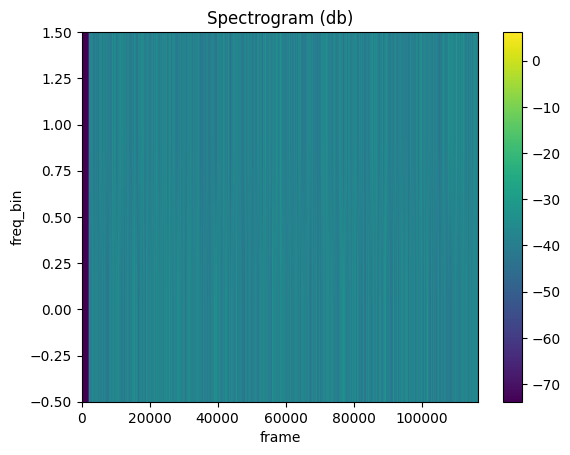

In [27]:
plot_spectrogram(noise)
Audio(noise.detach().numpy(), rate=sample_rate)

**Plot and audio reproduction of the predicted noise (which is the output of the model)**

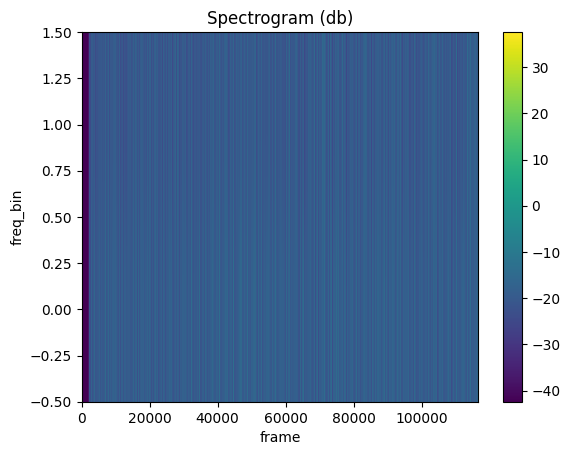

In [28]:
plot_spectrogram(noise_pred.detach().numpy())
Audio(noise_pred.detach().numpy(), rate=sample_rate)